# Statistics in Python

1. Analyzing Frequency Distributions
2. Mean
3. Mode
4. Median
5. STD
6. Correlation
7. Pairwise
8. Z-Scores

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
file_name = "https://raw.githubusercontent.com/rajeevratan84/datascienceforbusiness/master/winequalityN.csv"
df = pd.read_csv(file_name)
df.head()

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,white,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,white,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


### Let's use our pandas skills to create a column labelling quality with either good or bad

But first, let's look the quality scores distribution

<ipython-input-4-f005f9f04dff>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['quality'], bins=7, kde=False)


<Axes: xlabel='quality'>

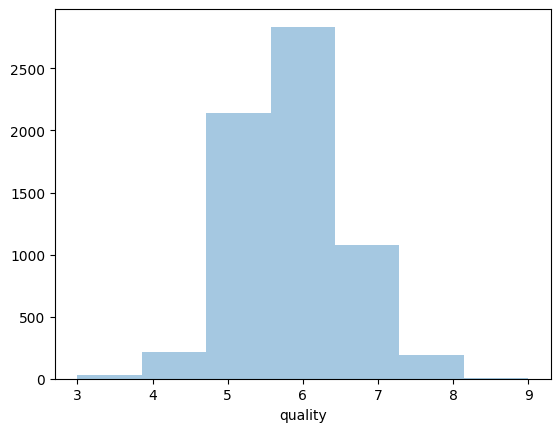

In [4]:
import seaborn as sns
sns.distplot(df['quality'], bins=7, kde=False)

In [8]:
df['rating'] = df['quality'].apply(lambda x: 'good' if x>= 6 else 'bad')
df.head(15)

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,rating
0,white,7.0,0.27,0.36,20.70,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6,good
1,white,6.3,0.30,0.34,1.60,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6,good
2,white,8.1,0.28,0.40,6.90,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6,good
3,white,7.2,0.23,0.32,8.50,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,good
4,white,7.2,0.23,0.32,8.50,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,good
5,white,8.1,0.28,0.40,6.90,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6,good
6,white,6.2,0.32,0.16,7.00,0.045,30.0,136.0,0.9949,3.18,0.47,9.6,6,good
7,white,7.0,0.27,0.36,20.70,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6,good
8,white,6.3,0.30,0.34,1.60,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6,good
9,white,8.1,0.22,0.43,1.50,0.044,28.0,129.0,0.9938,3.22,0.45,11.0,6,good


## Understanding lambda functions

lambda: arguements : expression

In [9]:
our_lambda_function = lambda x : x * 2
our_lambda_function(5)

10

In [10]:
def multiple_by_two(x):
  return x * 2
multiple_by_two(5)

10

In [1]:
# In the lambda case we write 'lambda arguments: expression'
# In our regular function we write 'def function(arguements): return expression'

## Let's go back to our plot

<Axes: xlabel='type', ylabel='count'>

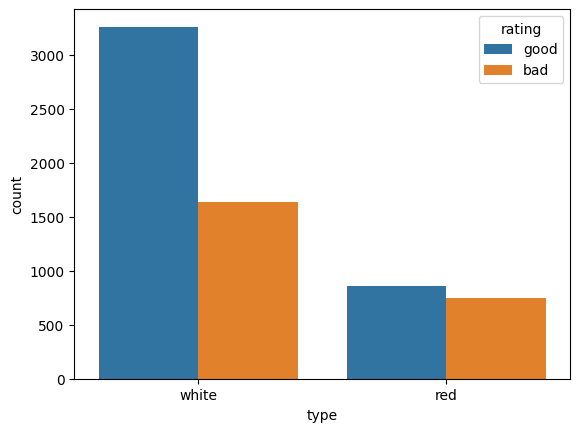

In [11]:
sns.countplot(x = 'type', hue = 'rating', data = df)

<Axes: xlabel='quality', ylabel='count'>

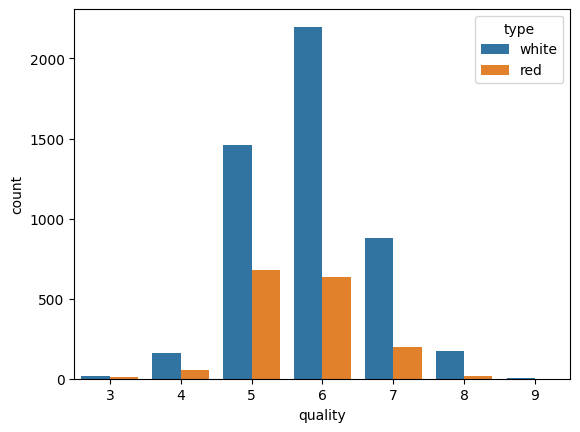

In [12]:
sns.countplot(x = df.quality, data = df, hue = 'type')

# Let's compare things a bit more and get a better picture of the difference between red and white wines usign Boxplots

![alt text](https://pro.arcgis.com/en/pro-app/help/analysis/geoprocessing/charts/GUID-0E2C3730-C535-40CD-8152-80D794A996A7-web.png)

In [13]:
df.columns

Index(['type', 'fixed acidity', 'volatile acidity', 'citric acid',
       'residual sugar', 'chlorides', 'free sulfur dioxide',
       'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol',
       'quality', 'rating'],
      dtype='object')

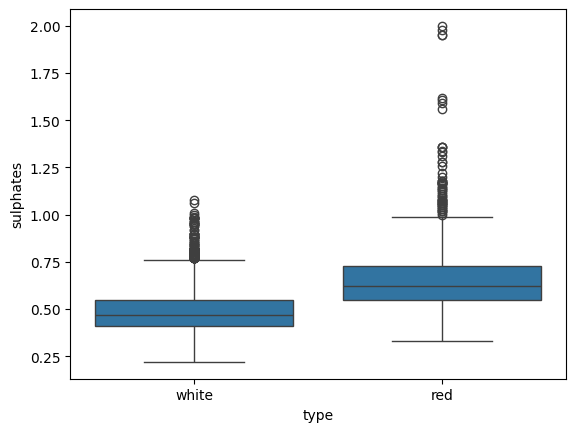

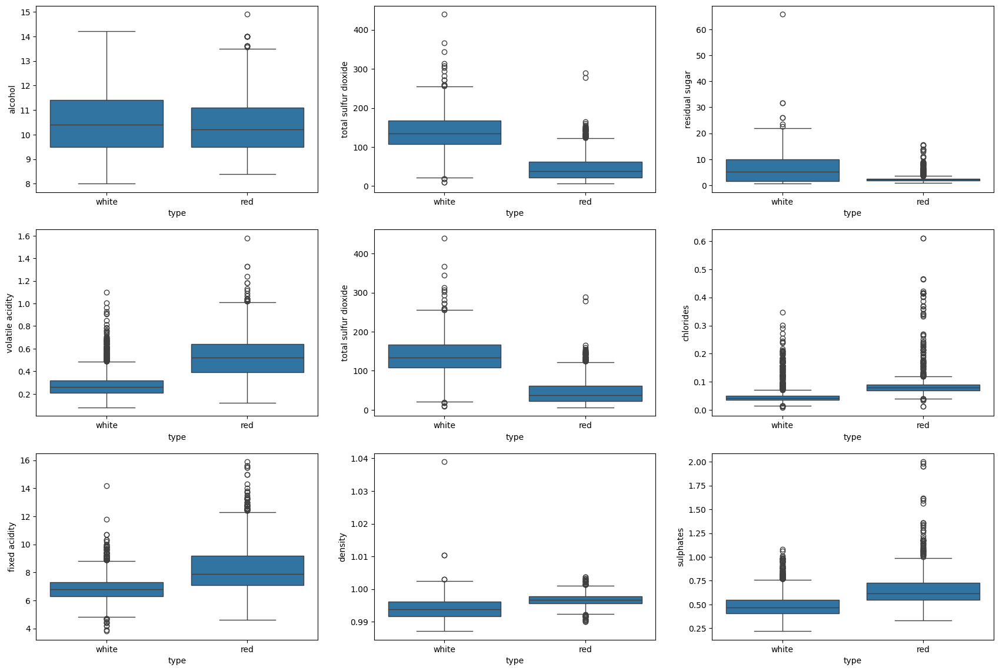

In [21]:
fig = plt.figure(figsize = (21, 14))
features = ["alcohol", "total sulfur dioxide", "residual sugar", "volatile acidity",
            "total sulfur dioxide", "chlorides", "fixed acidity", "density","sulphates"]
for (i, feature) in enumerate(features):
  ax1 = fig.add_subplot(3, 3, i + 1)
  sns.boxplot(x = "type", y = feature, data = df);

In [2]:
list_of_names = ["Rajeev", "Nidia", "Sam"]
for (i, name) in enumerate(list_of_names):
  print(i, name)

0 Rajeev
1 Nidia
2 Sam


In [3]:
list_of_names = ["Rajeev", "Nidia", "Sam"]
list_of_numbers = [1,2,3,4,5,6,7]
for (i, name) in enumerate(list_of_names):
  print(i, name, list_of_numbers[i])

0 Rajeev 1
1 Nidia 2
2 Sam 3


In [26]:
df[df['type'] == 'red']['alcohol'].describe()

count    1599.000000
mean       10.422983
std         1.065668
min         8.400000
25%         9.500000
50%        10.200000
75%        11.100000
max        14.900000
Name: alcohol, dtype: float64

<Axes: ylabel='alcohol'>

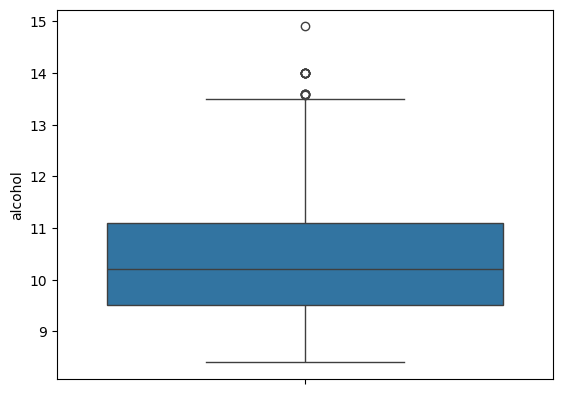

In [31]:
sns.boxplot(df[df['type'] == 'red']['alcohol'], orient = "v")

# Finding the Mean, Mode and Median

In [23]:
import pandas as pd
file_name = "https://raw.githubusercontent.com/rajeevratan84/datascienceforbusiness/master/titanic.csv"
df = pd.read_csv(file_name)
df.head()

,pclass,name,sex,age,sibsp,parch,ticket,fare,cabin,embarked,survived
0,1,"Allen, Miss. Elisabeth Walton",female,29.0000,0,0,24160,211.3375,B5,S,1
1,1,"Allison, Master. Hudson Trevor",male,0.9167,1,2,113781,151.5500,C22 C26,S,1
2,1,"Allison, Miss. Helen Loraine",female,2.0000,1,2,113781,151.5500,C22 C26,S,0
3,1,"Allison, Mr. Hudson Joshua Creighton",male,30.0000,1,2,113781,151.5500,C22 C26,S,0
4,1,"Allison, Mrs. Hudson J C (Bessie Waldo Daniels)",female,25.0000,1,2,113781,151.5500,C22 C26,S,0


In [24]:
df.describe()

,pclass,age,sibsp,parch,fare,survived
count,1309.000000,1046.000000,1309.000000,1309.000000,1308.000000,1309.000000
mean,2.294882,29.881135,0.498854,0.385027,33.295479,0.381971
std,0.837836,14.413500,1.041658,0.865560,51.758668,0.486055
min,1.000000,0.166700,0.000000,0.000000,0.000000,0.000000
25%,2.000000,21.000000,0.000000,0.000000,7.895800,0.000000
50%,3.000000,28.000000,0.000000,0.000000,14.454200,0.000000
75%,3.000000,39.000000,1.000000,0.000000,31.275000,1.000000
max,3.000000,80.000000,8.000000,9.000000,512.329200,1.000000


In [25]:
def getMode(dataset, feature):
  return dataset[feature].value_counts().index[0]
getMode(df, 'pclass')

3

In [26]:
getMode(df, 'sex')

'male'

In [27]:
getMode(df, 'age')

24.0

# Finding the Median

In [28]:
numeric_df = df.select_dtypes(include = 'number')
median_numeric = numeric_df.median()
print(median_numeric)

pclass       3.0000
age         28.0000
sibsp        0.0000
parch        0.0000
fare        14.4542
survived     0.0000
dtype: float64


# Getting the Mean, Median and Mode

In [11]:
print("Mean = " + str(df['age'].mean()))
print("Median = " + str(df['age'].median()))
print("Mode = " + str(getMode(df, 'age')))

Mean = 29.8811345124283
Median = 28.0
Mode = 24.0


In [ ]:
print(df['alcohol'].max())
print(df['alcohol'].min())

# Standard Deviation

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
file_name = "https://raw.githubusercontent.com/rajeevratan84/datascienceforbusiness/master/winequalityN.csv"
df = pd.read_csv(file_name)
df.head()

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,white,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,white,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


1.192711748868981
10.491800831149455


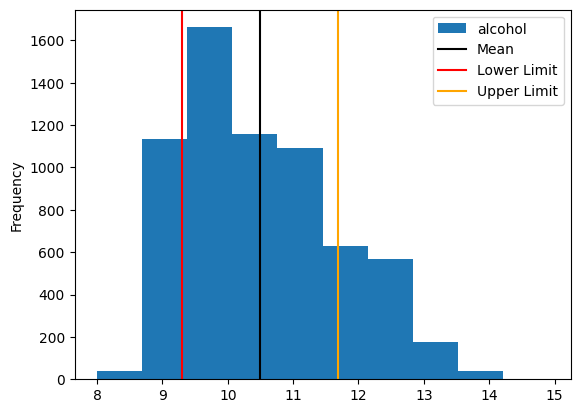

In [3]:
mean = df['alcohol'].mean()
st_dev = df['alcohol'].std()
df['alcohol'].plot.hist()
plt.axvline(mean, color = 'Black', label = 'Mean')
plt.axvline(mean - st_dev, color = 'Red', label = 'Lower Limit')
plt.axvline(mean + st_dev, color = 'Orange', label = 'Upper Limit')
plt.legend()
print(st_dev)
print(mean)

1.4225613158901027
10.491800831149455


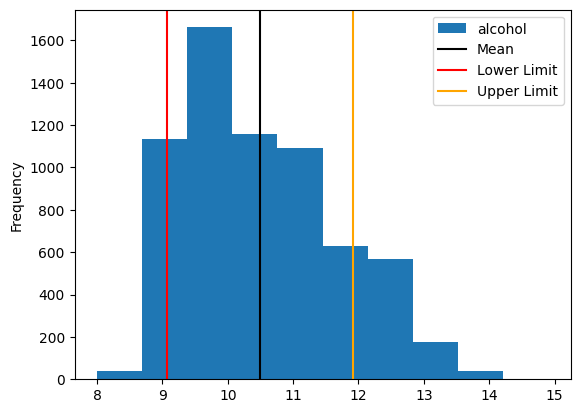

In [4]:
mean = df['alcohol'].mean()
variance = df['alcohol'].var()
df['alcohol'].plot.hist()
plt.axvline(mean, color = 'Black', label = 'Mean')
plt.axvline(mean - variance, color = 'Red', label = 'Lower Limit')
plt.axvline(mean + variance, color = 'Orange', label = 'Upper Limit')
plt.legend()
print(variance)
print(mean)

STD vs VAR?
http://www.leeds.ac.uk/educol/documents/00003759.htm

# Correlation Matrix

<Axes: >

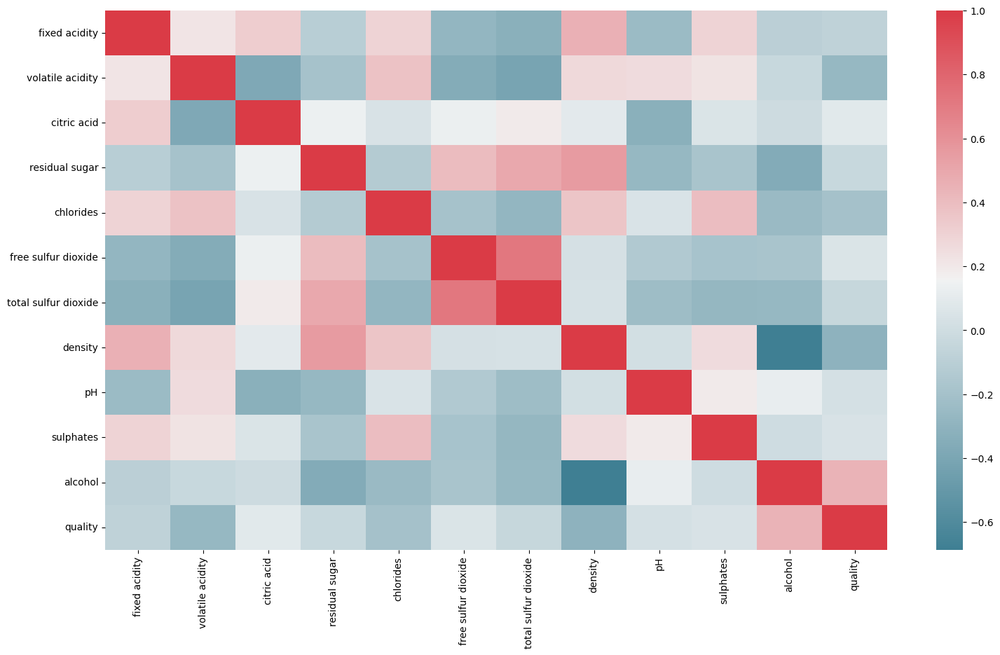

In [6]:
numeric_df = df.select_dtypes(include='number')
corr = numeric_df.corr()
plt.figure(figsize = (18, 10))
sns.heatmap(corr, cmap=sns.diverging_palette(220, 10, as_cmap = True))

# Pairwise Plots - Show the scatter plots between all features in our dataset

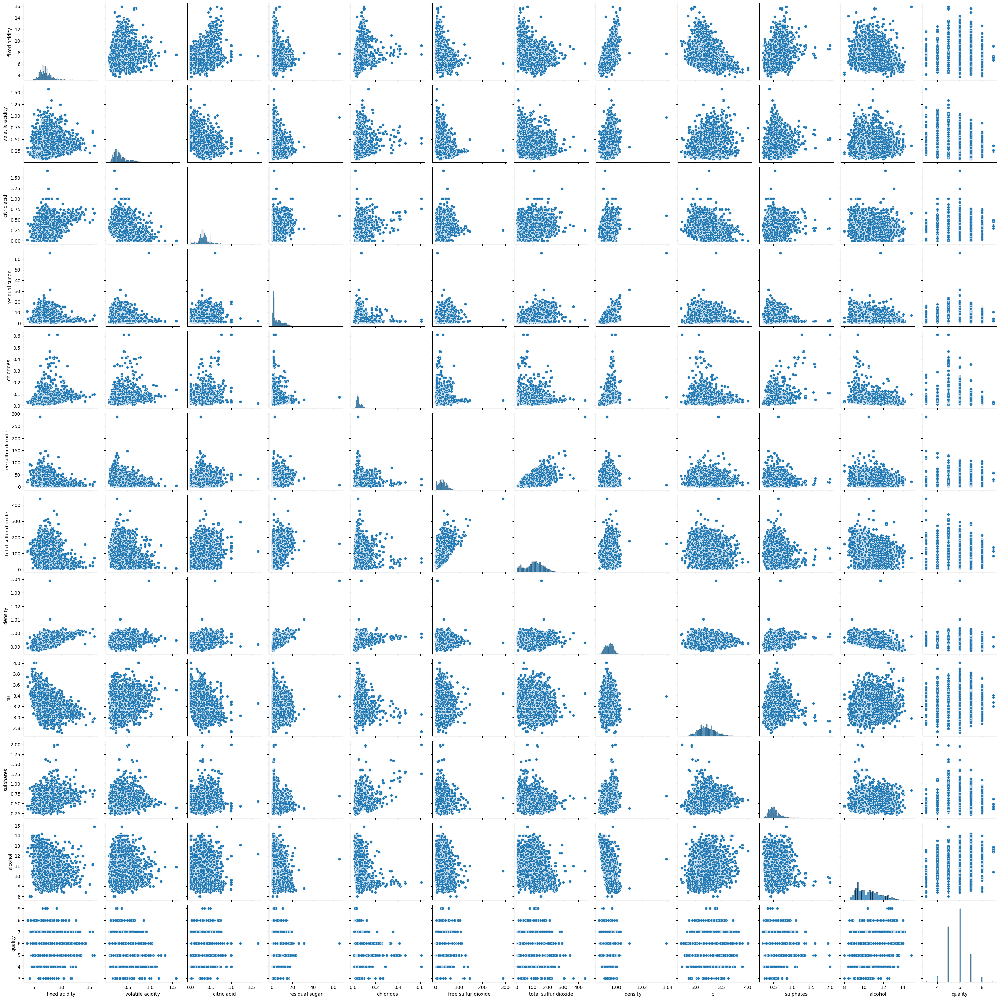

In [7]:
g = sns.pairplot(df)

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable h

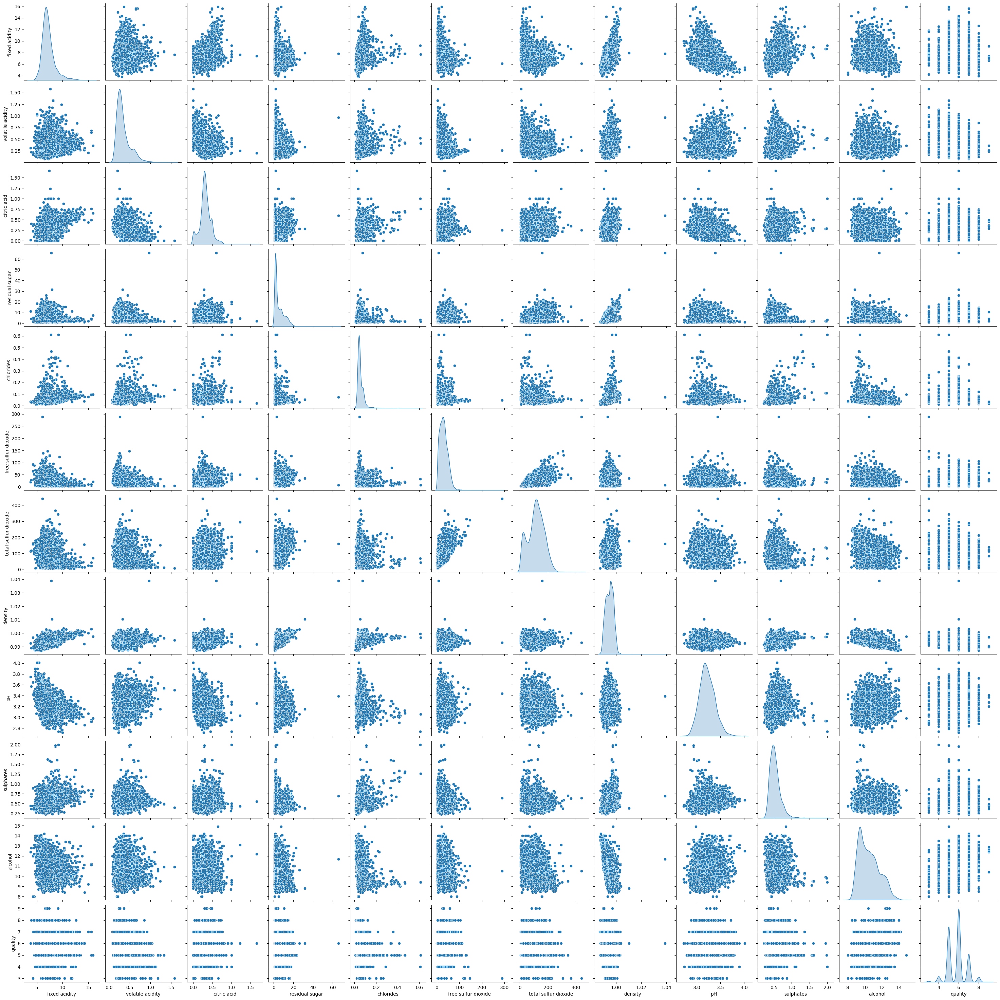

In [9]:
g = sns.pairplot(df, palette = "husl", diag_kind = "kde")

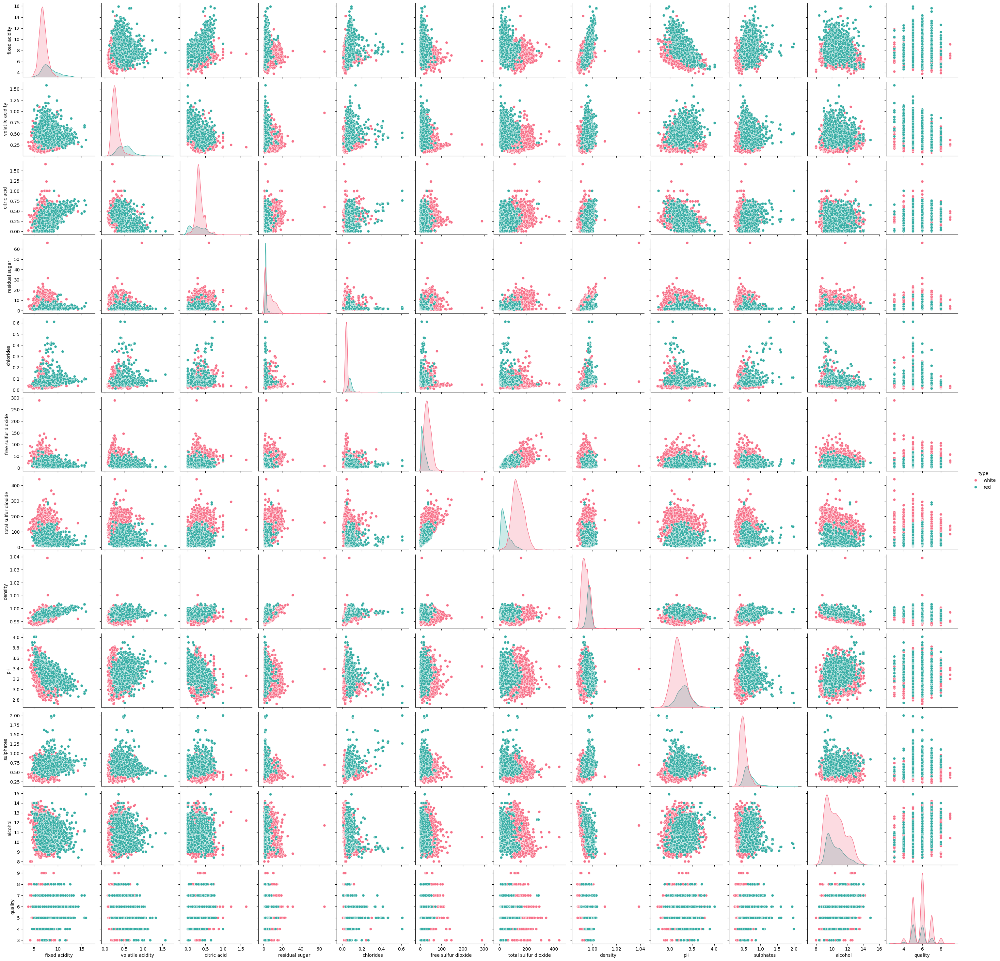

In [11]:
g = sns.pairplot(df, palette = "husl", diag_kind = "kde", hue = "type")

In [12]:
df.head()

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,white,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,white,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


# Z-Scores

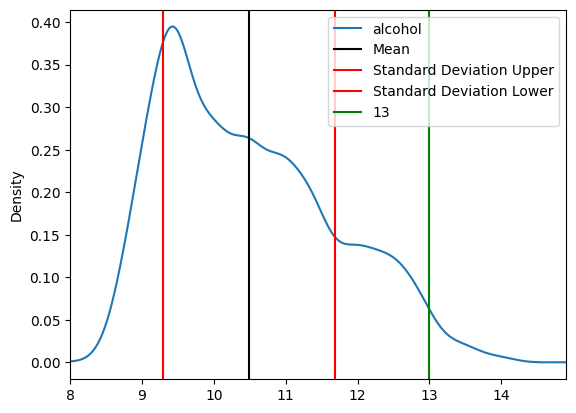

In [13]:
import pandas as pd
import matplotlib.pyplot as plt
df['alcohol'].plot.kde(xlim = (df['alcohol'].min(), df['alcohol'].max()))
std = df['alcohol'].std(ddof = 0)
mean = df['alcohol'].mean()
plt.axvline(mean, color = 'Black', label = 'Mean')
plt.axvline(mean + std, color = 'Red', label = 'Standard Deviation Upper')
plt.axvline(mean - std, color = 'Red', label = 'Standard Deviation Lower')
plt.axvline(13, color = 'Green', label = '13')
plt.legend()

In [15]:
df['alcohol'].describe()

count    6497.000000
mean       10.491801
std         1.192712
min         8.000000
25%         9.500000
50%        10.300000
75%        11.300000
max        14.900000
Name: alcohol, dtype: float64

## Converting an entire distribution to its z-scores

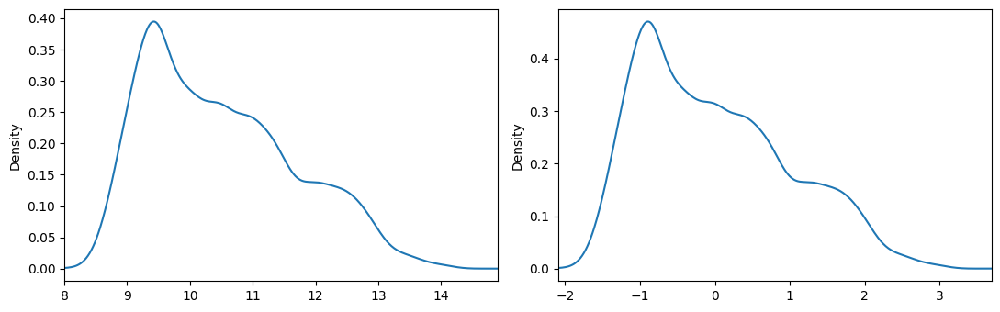

In [18]:
mean = df['alcohol'].mean()
std = df['alcohol'].std(ddof = 0)
df['z-scores'] = df['alcohol'].apply(lambda x: ((x - mean) / std))
plt.figure(figsize = (11, 3.5))
plt.subplot(1, 2, 1)
df['alcohol'].plot.kde(xlim = (df['alcohol'].min(), df['alcohol'].max()))
plt.subplot(1, 2, 2)
df['z-scores'].plot.kde(xlim = (df['z-scores'].min(), df['z-scores'].max()))
plt.tight_layout()

In [19]:
z_mean_area = df['z-scores'].mean()
z_stdev_area = df['z-scores'].std(ddof = 0)
print(z_mean_area)
print(z_stdev_area)

-8.399212268181576e-16
0.9999999999999999
